In [8]:
import numpy as np 
import pandas as pd
import cv2 
from matplotlib import pyplot as plt 
from pylab import imread
from skimage.color import rgb2gray
from google.colab import files

In [4]:
def imshows(ImageData, LabelData, rows, cols, gridType = False):
  # Convert ImageData and LabelData to List
  from matplotlib import pyplot as plt
  ImageArray = list(ImageData)
  LabelArray = list(LabelData)
  if(rows == 1 & cols == 1):
    fig = plt.figure(figsize=(20,20))
  else:
    fig = plt.figure(figsize=(cols*8,rows*5))
        
  for i in range(1, cols * rows + 1):
      fig.add_subplot(rows, cols, i)
      image = ImageArray[i - 1]
      # If the channel number is less than 3, we display as grayscale image
      # otherwise, we display as color image
      if (len(image.shape) < 3):
          plt.imshow(image, plt.cm.gray)
          plt.grid(gridType)
      else:
          plt.imshow(image)
          plt.grid(gridType)
      plt.title(LabelArray[i - 1])
  plt.show()

def ShowThreeImages(IM1, IM2, IM3):
    imshows([IM1, IM2, IM3], ["Image 1","Image 2", "Image 3"], 1, 3)
def ShowTwoImages(IM1, IM2):
    imshows([IM1, IM2], ["Image 1","Image 2"], 1, 2)
def ShowOneImage(IM):
    imshows([IM], ["Image"], 1, 1)
def ShowListImages(listImage, row, col):
    listCaption = []
    for i in range(len(listImage)):
        listCaption.append(str(i))
    imshows(listImage,listCaption,row,col)

In [9]:
uploads = files.upload()

Saving Truc.jpg to Truc.jpg


Viết thành một function cho biết thông tin của bức ảnh : Ảnh màu hay ảnh xám và giá trị min max tương ứng với cừng kênh màu

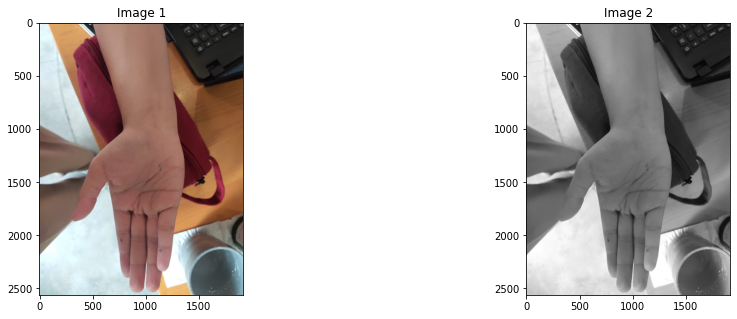

In [10]:
# Read Image 
image_color = imread("Truc.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

# Display Image
ShowTwoImages(image_color, image_gray)

In [11]:
# Show Information of Color Image
Image = image_color.copy()
Width = Image.shape[1]
Height = Image.shape[0]
Channel = len(Image.shape)
print("Width : ", Width, " Height : ", Height, " Channel : ", Channel)

IM = image_color.copy
if(Channel == 2):
    print("Min Intensity: ", Image.min(), " Max Intensity: ", Image.max())
else:
    print("Red - Min Intensity: ", Image[:,:,0].min(), " Max Intensity: ", Image[:,:,0].max())
    print("Green - Min Intensity: ", Image[:,:,1].min(), " Max Intensity: ", Image[:,:,1].max())
    print("Blue - Min Intensity: ", Image[:,:,2].min(), " Max Intensity: ", Image[:,:,2].max())   

Width :  1920  Height :  2560  Channel :  3
Red - Min Intensity:  0  Max Intensity:  255
Green - Min Intensity:  0  Max Intensity:  255
Blue - Min Intensity:  0  Max Intensity:  255


In [12]:
# Show Information of Gray Image
Image = image_gray.copy()
Width = Image.shape[1]
Height = Image.shape[0]
Channel = len(Image.shape)
print("Width : ", Width, " Height : ", Height, " Channel : ", Channel)

IM = image_color.copy
if(Channel == 2):
    print("Min Intensity: ", Image.min(), " Max Intensity: ", Image.max())
else:
    print("Red - Min Intensity: ", Image[:,:,0].min(), " Max Intensity: ", Image[:,:,0].max())
    print("Green - Min Intensity: ", Image[:,:,1].min(), " Max Intensity: ", Image[:,:,1].max())
    print("Blue - Min Intensity: ", Image[:,:,2].min(), " Max Intensity: ", Image[:,:,2].max())

Width :  1920  Height :  2560  Channel :  2
Min Intensity:  0  Max Intensity:  255


Hiển thị 24 bức ảnh theo bit của từng kênh màu R, G, B (mỗi kênh 8 ảnh x 3 kênh = 24 ảnh bit) 


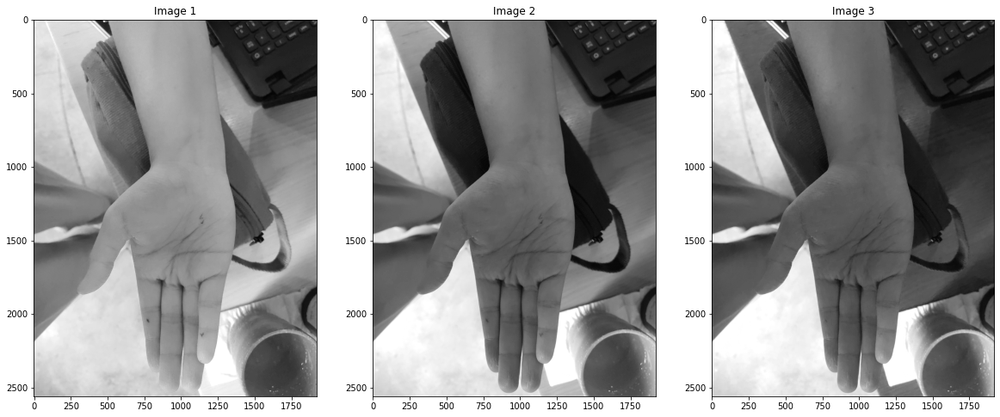

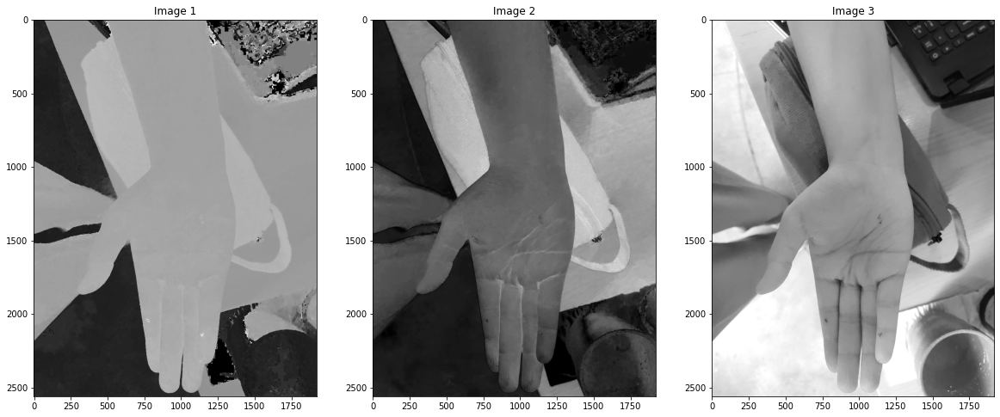

In [13]:
# Convert Image into HSV color spaces
image_hsv = cv2.cvtColor(image_color, cv2.COLOR_BGR2HSV)

# Show each channel R, G, and B
ShowThreeImages(image_color[:,:,0],image_color[:,:,1],image_color[:,:,2])
# Show each channel H , S and V
ShowThreeImages(image_hsv[:,:,0],image_hsv[:,:,1],image_hsv[:,:,2])

In [14]:
def intToBitArray(img) :
    row ,col = img.shape
    list = []
    for i in range(row):
        for j in range(col):
             list.append (np.binary_repr( img[i][j] ,width=8  ) )
    return list #the binary_repr() fucntion returns binary values but in 
                #string 
                #, not integer, which has it's own perk as you will notice 
def bitplane(bitImgVal , img1D ):
    bitList = [  int(   i[bitImgVal]  )    for i in img1D]
    return bitList
def GetBitImage(index, image2D):
    ImageIn1D = intToBitArray(image2D)
    Imagebit = np.array( bitplane(index, ImageIn1D ) )
    Imagebit = np.reshape(Imagebit , image2D.shape )
    return Imagebit
def GetAllBitImage(image2D):
    image2D_Bit = list()
    for i in range(8):
        image2D_Bit.append(GetBitImage(i, image2D))
    return image2D_Bit

List have  8  images


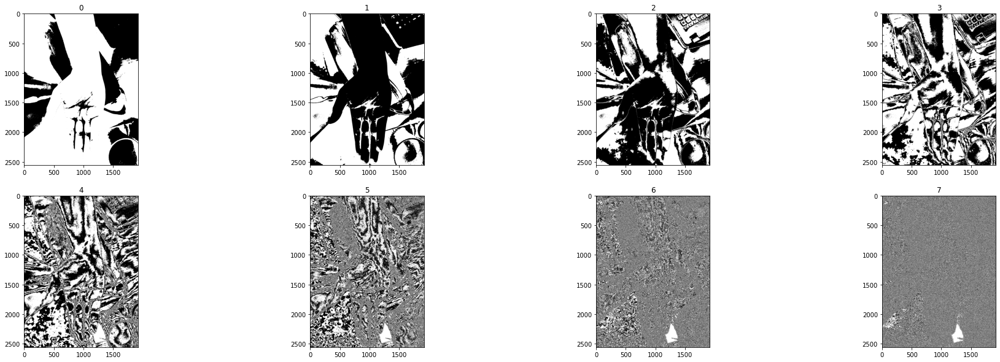

In [16]:
# Get 8 Mask Image corresponding to 8 bit of grayscale image
image2D_Bit = GetAllBitImage(image_color[:,:,0])
print("List have ", len(image2D_Bit), " images")
ShowListImages(image2D_Bit, 2, 4)

List have  8  images


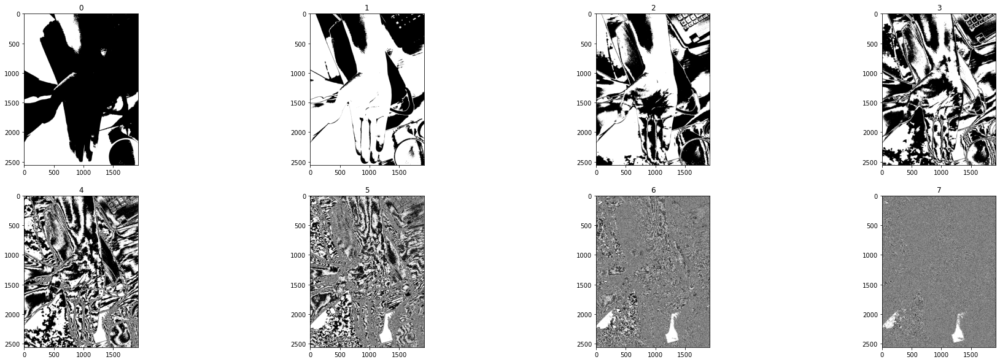

In [17]:
image2D_Bit = GetAllBitImage(image_color[:,:,1])
print("List have ", len(image2D_Bit), " images")
ShowListImages(image2D_Bit, 2, 4)

List have  8  images


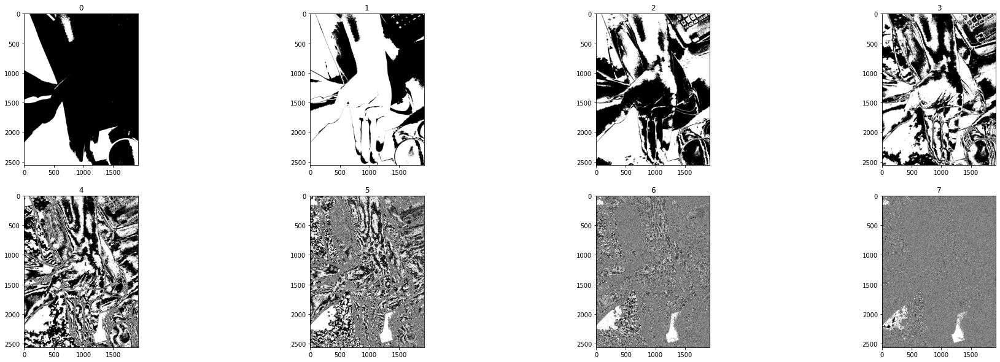

In [18]:
image2D_Bit = GetAllBitImage(image_color[:,:,2])
print("List have ", len(image2D_Bit), " images")
ShowListImages(image2D_Bit, 2, 4)

Hiển thị 24 bức ảnh theo bit của từng kênh màu H, S, V (mỗi kênh 8 ảnh x 3 kênh = 24 ảnh bit) 

In [19]:
# Convert Image into HSV color spaces
image_hsv = cv2.cvtColor(image_color, cv2.COLOR_BGR2HSV)

List have  8  images


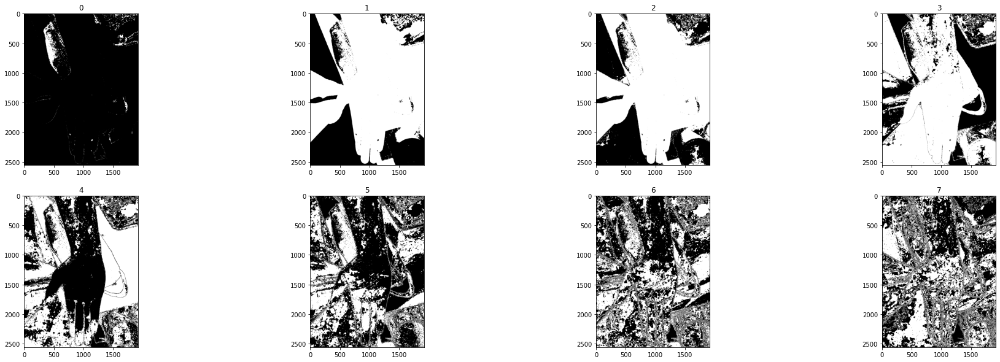

In [20]:
image2D_Bit = GetAllBitImage(image_hsv[:,:,0])
print("List have ", len(image2D_Bit), " images")
ShowListImages(image2D_Bit, 2, 4)

List have  8  images


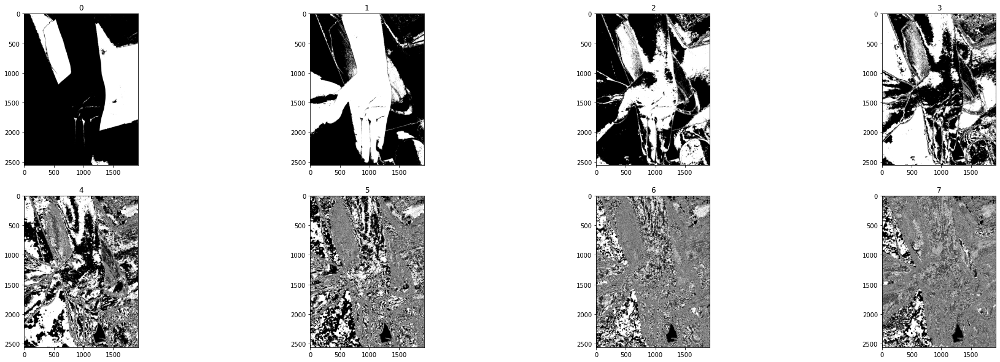

In [21]:
image2D_Bit = GetAllBitImage(image_hsv[:,:,1])
print("List have ", len(image2D_Bit), " images")
ShowListImages(image2D_Bit, 2, 4)

List have  8  images


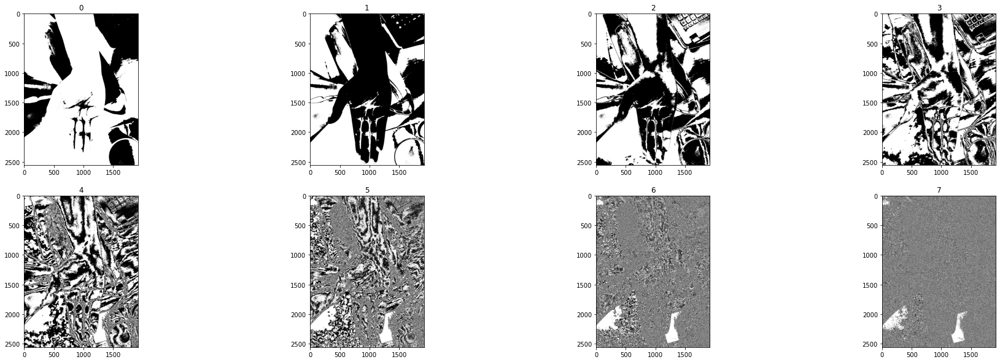

In [22]:
image2D_Bit = GetAllBitImage(image_hsv[:,:,2])
print("List have ", len(image2D_Bit), " images")
ShowListImages(image2D_Bit, 2, 4)

Cho biết trong 24 ảnh bit theo kênh R, G, B có ảnh nào có thể dùng để trích xuất đối tượng hay không. Nếu có thì hiển thị ảnh bit đó ra

Cho biết trong 24 ảnh bit theo kênh H, S, V có ảnh nào có thể dùng để trích xuất đối tượng hay không. Nếu có thì hiển thị ảnh bit đó ra

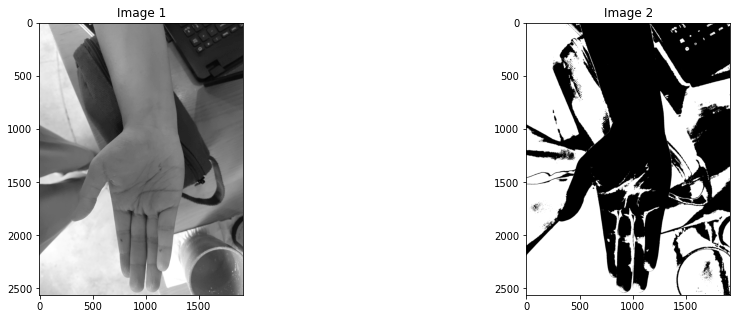

In [23]:
# Take the highest bit image 
CellMask01 = image2D_Bit[1]
ShowTwoImages(image_gray, CellMask01)

Bài 2

Viết 1 function input ảnh màu và xuất ảnh chân dung xám và chân dùng màu của ảnh đó 

In [24]:
uploads = files.upload()

Saving Ca.jpg to Ca.jpg


Image Size: (283, 575, 3)


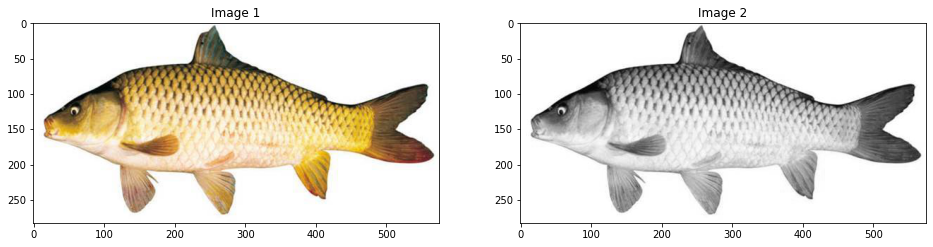

In [25]:
# Read Image 
image_color = imread("Ca.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

# Display Image
print("Image Size:", image_color.shape)
ShowTwoImages(image_color, image_gray)

Tìm chọn range màu lower và upper để trích xuất được các khuôn mặt trong ảnh màu 

In [26]:
import cv2
from skimage import feature, filters

edges_canny = feature.canny(image_gray) # Canny
edges_sobel = filters.sobel(image_gray) # Sobel
edges_laplace = filters.laplace(image_gray) # Laplacian
edges_scharr = filters.scharr(image_gray) # Scharr
edges_prewitt = filters.prewitt(image_gray) # Prewitt
edges_roberts = filters.roberts(image_gray) # Roberts

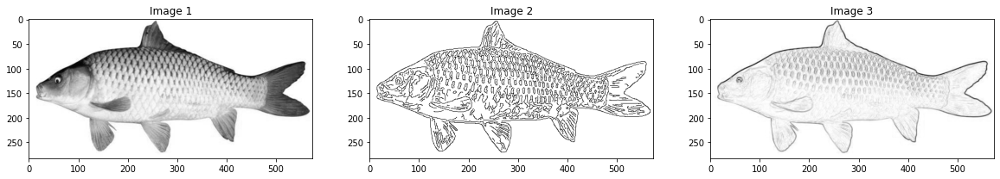

In [27]:
# Invert 
ShowThreeImages(image_gray, 1 - edges_canny, 1 - edges_sobel)

In [28]:
# Edge Detection on Color Image
from skimage.color.adapt_rgb import adapt_rgb, each_channel, hsv_value
from skimage import filters

@adapt_rgb(each_channel)
def sobel_each(image):
    return filters.sobel(image)

@adapt_rgb(hsv_value)
def sobel_hsv(image):
    return filters.sobel(image)

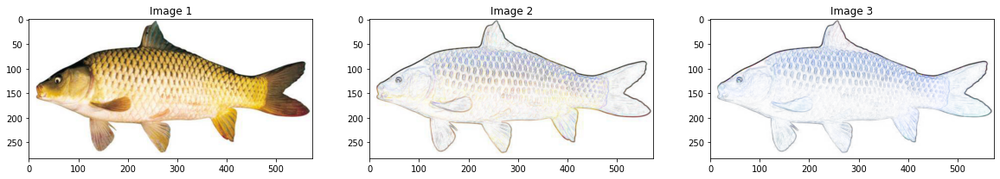

In [29]:
from skimage.exposure import rescale_intensity

image_sobel_rgb = rescale_intensity(1 - sobel_each(image_color))
image_sobel_hsv = rescale_intensity(1 - sobel_hsv(image_color))

ShowThreeImages(image_color, image_sobel_rgb, image_sobel_hsv)

Bai3


In [31]:
uploads = files.upload()

Saving Hoa.jpeg to Hoa.jpeg


Image Size: (189, 267, 3)


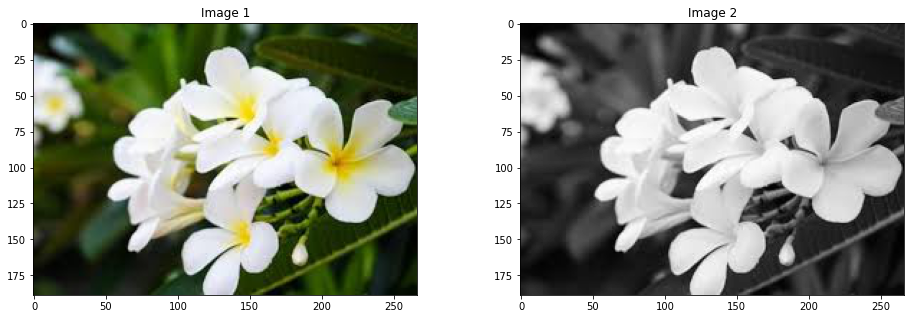

In [33]:
# Read Image 
image_color = imread("Hoa.jpeg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

# Display Image
print("Image Size:", image_color.shape)
ShowTwoImages(image_color, image_gray)

Xuất ảnh xoay các góc 30,45,60 độ

Xuất ảnh đối xứng qua trục hoành và trục tung đi qua tâm ảnh

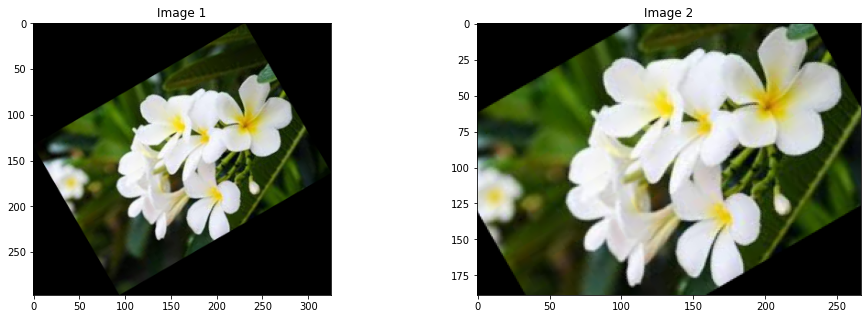

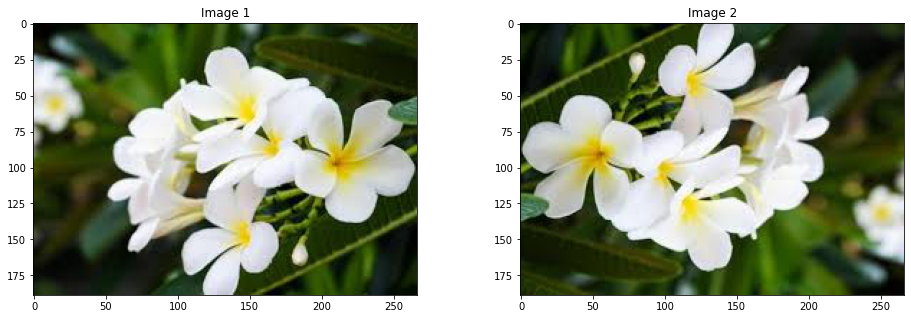

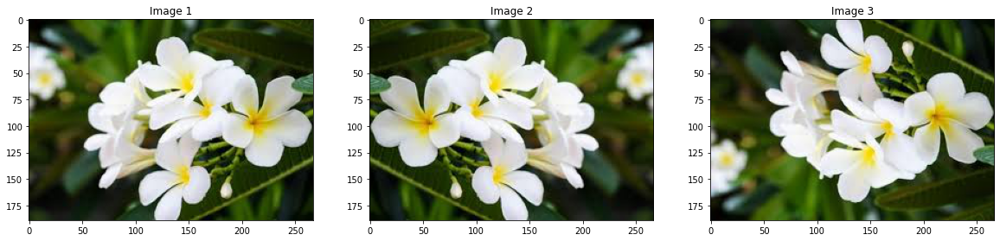

In [34]:
from skimage.transform import rotate
image_color_rotate_30_01 = rotate(image_color, 30, resize=True)
image_color_rotate_30_02 = rotate(image_color, 30)
ShowTwoImages(image_color_rotate_30_01, image_color_rotate_30_02)

image_color_rotate_180 = rotate(image_color, 180, resize=True)
ShowTwoImages(image_color, image_color_rotate_180)

image_color_horizontal_flip = image_color[:, ::-1]
image_color_vertical_flip = image_color[::-1, :]

ShowThreeImages(image_color, image_color_horizontal_flip,image_color_vertical_flip)

Xuất ảnh inversion

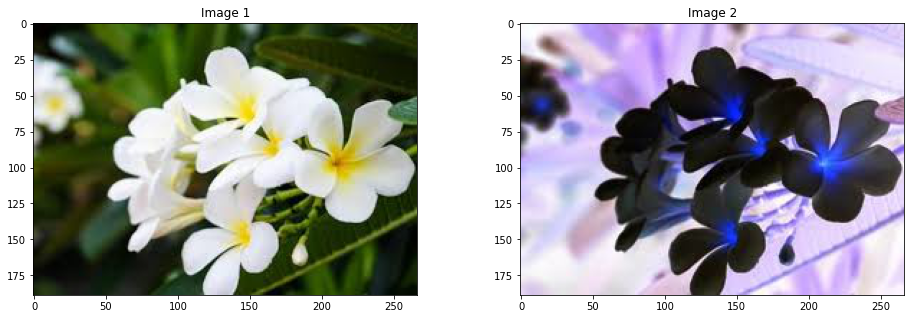

In [35]:
from skimage import util
image_color_inversion = util.invert(image_color)
ShowTwoImages(image_color, image_color_inversion)

Xuất ảnh enhance contrast

7.0 235.0


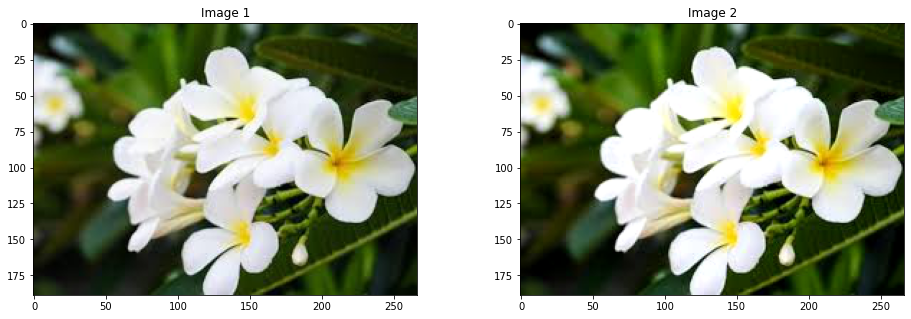

In [36]:
import numpy as np
from skimage import exposure

# take from 10 to 90 percent of color range
v_min, v_max = np.percentile(image_color, (10, 90))
better_contrast = exposure.rescale_intensity(image_color, in_range=(v_min, v_max))

print(v_min, v_max)
ShowTwoImages(image_color, better_contrast)

Xuất ảnh gamma và log enhancement 

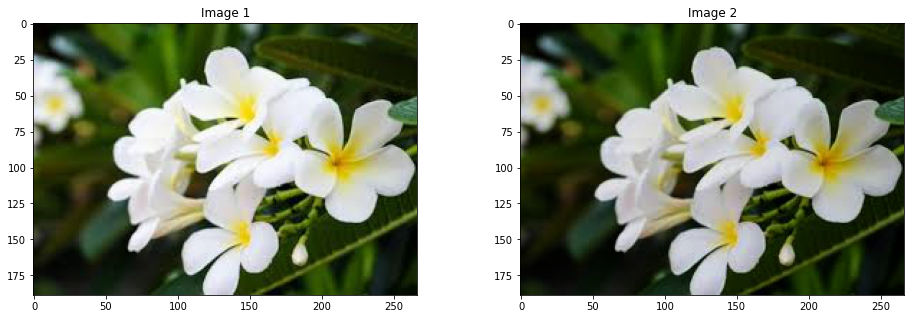

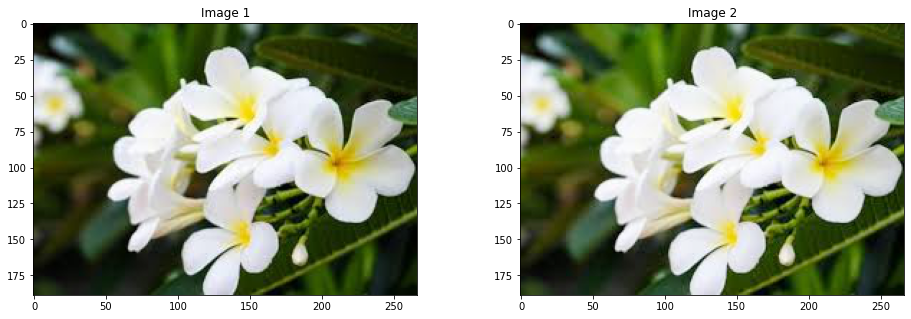

In [37]:
# gamma and gain parameters are between 0 and 1
adjusted_gamma_image = exposure.adjust_gamma(image_color, gamma=1.2, gain=0.9)
ShowTwoImages(image_color, adjusted_gamma_image)
# Logarithmic corrected
log_correction_image = exposure.adjust_log(image_color)

ShowTwoImages(image_color, log_correction_image)